<center><h1>Speech AI<br><small>Examples</small></h1></center>
<br><br>

<center style="font-size:140%;">
    <strong>Toni Heittola</strong><br>
    <small>toni.heittola@tuni.fi</small>
</center>
<table><tr>
<td><img src="images/ARG_logo.png" alt="Drawing" style="width:350px;"/></td>
    <td><img src="images/marvel_logo.png" alt="Drawing" style="width:350px;"/></td>
<td><img src="images/TAU_logo.png" alt="Drawing" style="width:250px;"/></td>
</tr></table>

In [1]:
import os, sys
from IPython.display import Audio
from IPython.utils import io
from ipywebrtc import AudioRecorder, CameraStream
import torch, torchaudio
import librosa
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
plt.rcParams["figure.figsize"]=18,5
import numpy as np
import dcase_util
from dcase_util.containers import AudioContainer
import warnings
warnings.filterwarnings("ignore")
import logging
logging.disable(logging.ERROR) # To suppress some speechbrain announcements

test_audio_filename = os.path.join('audio', 'speech_mixture.wav')
test_audio_noisy_filename = os.path.join('audio', 'speech_mixture_noisy.wav')

def tensor_to_numpy(data):
    return data.detach().cpu().numpy().reshape(-1)

# Introduction

Applications covered:

- Speech separation
- Speech enhancement
- Language identification
- Speech recognition
- Text to speech
- Voice activity detection

## Key tools used:

- **`speechbrain`** &ndash; PyTorch powered speech toolkit, https://speechbrain.github.io/
- **`espnet`** &ndash; end-to-end speech processing toolkit, https://github.com/espnet/espnet

Pretrained models are mostly downloaded from [**Hugging Face**](https://huggingface.co/)

# Speech separation

*The task of extracting overlapping speech sources in a given mixed speech signal*

<img src="images/speech_separation.png" width="600">



## SepFormer
**Transformer-based neural network for speech separation**

- State-of-the-art speech separation system published 2021
- Uses transformers that replace RNNs with a multi-scale pipeline composed of transformers that learn both short and long-term dependencies
- Model composed of multi-head attention and feed-forward layers
- Trained with [WSJ0-2mix](https://www.merl.com/demos/deep-clustering) dataset with mixtures of two overlapping speakers
- Designed for single-channel audio with an 8kHz sampling rate

<small>C. Subakan, M. Ravanelli, S. Cornell, M. Bronzi and J. Zhong, "<strong>Attention Is All You Need In Speech Separation</strong>," ICASSP 2021 - 2021 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP), 2021, pp. 21-25. <a href="https://arxiv.org/pdf/2010.13154v2.pdf" target="_blank">PDF</a></small> 

## Usage

We will use `SepformerSeparation` class from the SpeechBrain library with pretrained model (**speechbrain/sepformer-wsj02mix**) from Hugging Face (https://huggingface.co/speechbrain/sepformer-wsj02mix).

In [2]:
# Import 
from speechbrain.pretrained import SepformerSeparation

# Create and download pretrained model
speech_separator = SepformerSeparation.from_hparams(
    source='speechbrain/sepformer-wsj02mix',        # Model name
    savedir='pretrained_models/sepformer-wsj02mix', 
    run_opts={'device':'cuda'}                      # Use GPU 
)

# Apply model to example audio
estimated_sources = speech_separator.separate_file(
    path='speechbrain/sepformer-wsj02mix/test_mixture.wav'
) 

## Example

Signal with two males speaking different languages (English and French) <br> at the same time

### Mixture signal

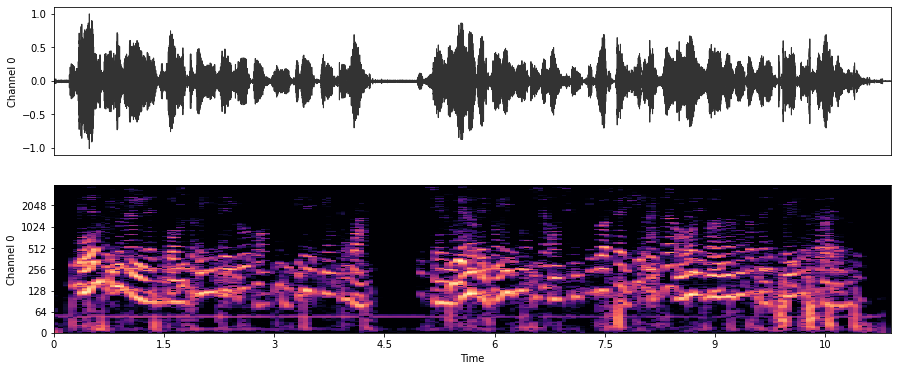

In [3]:
# Load example audio
mixture = AudioContainer().load(
    filename=test_audio_filename, 
    fs=8000, 
    mono=True
)

mixture.plot(plot_type='dual', show_filename=False, figsize=(15,6))
Audio(mixture.data, rate=mixture.fs)

## Estimate sound sources

In [4]:
# Estimate source from the mixure signal
estimated_sources = speech_separator.separate_batch(
    torch.from_numpy(mixture.data).float()[None,:]
)

In [5]:
# Create audio containers for source1 and source2
source1 = AudioContainer(
    data=tensor_to_numpy(estimated_sources[:, :, 0]), 
    fs=8000
)
source2 = AudioContainer(
    data=tensor_to_numpy(estimated_sources[:, :, 1]), 
    fs=8000
)

## Source 1

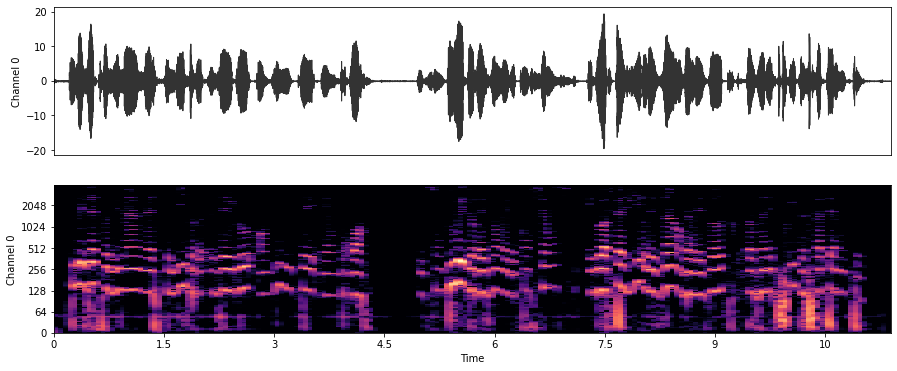

In [6]:
source1.plot(plot_type='dual', figsize=(15,6))
Audio(source1.data, rate=source1.fs)

## Source 2

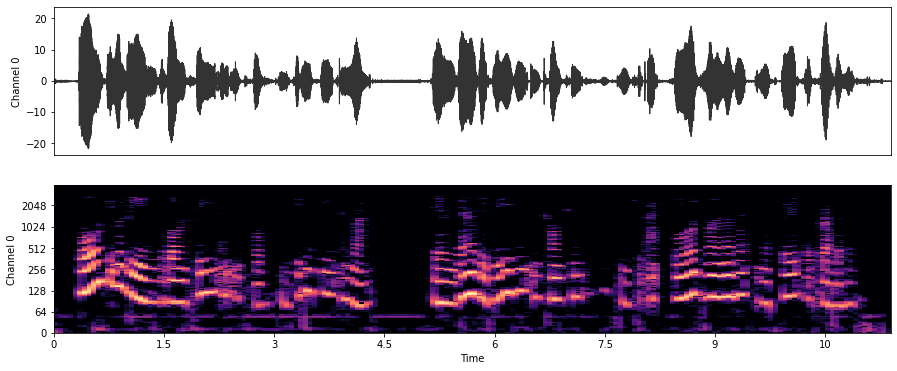

In [7]:
source2.plot(plot_type='dual', figsize=(15,6))
Audio(source2.data, rate=source2.fs)

# Speech enhancement

*The task to improve speech quality*

<img src="images/speech_enhancement.png" width="400">

## SepFormer for Speech Enhancement
**Transformer-based neural network for speech separation**

- Speech separation system can be used for speech enhancement too
- Trained with [WHAMR!](http://wham.whisper.ai/) dataset
    - Augmented version of [WHAM!](http://wham.whisper.ai/) dataset with synthetic reverberated sources
    - WHAM! is a noise augmented version of the [WSJ0-2mix](https://www.merl.com/demos/deep-clustering) dataset
    - Dataset contains overlapping speech with varying gains and environmental noises recorded in various urban environments
    - Dataset contains 28000 samples, and in total 81 hours of audio
- Designed for single-channel audio with an 8kHz sampling rate

<small>C. Subakan, M. Ravanelli, S. Cornell, M. Bronzi and J. Zhong, "<strong>Attention Is All You Need In Speech Separation</strong>," ICASSP 2021 - 2021 IEEE International Conference on Acoustics, Speech, and Signal Processing (ICASSP), 2021, pp. 21-25. <a href="https://arxiv.org/pdf/2010.13154v2.pdf" target="_blank">PDF</a></small> 

## Usage

We will use again `SepformerSeparation` class from the SpeechBrain library with pretrained model (**speechbrain/sepformer-whamr-enhancement**) from Hugging Face (https://huggingface.co/speechbrain/sepformer-whamr-enhancement).

In [18]:
from speechbrain.pretrained import SepformerSeparation

speech_enhancer = SepformerSeparation.from_hparams(
    source='speechbrain/sepformer-whamr-enhancement', 
    savedir='pretrained_models/sepformer-whamr-enhancement'
)

est_sources = speech_enhancer.separate_file(
    path='speechbrain/sepformer-whamr-enhancement/example_whamr.wav'
)

## Example with two source in noisy environment

Mixture signal with two males speaking different languages (English and French) at the same time in a metro station.

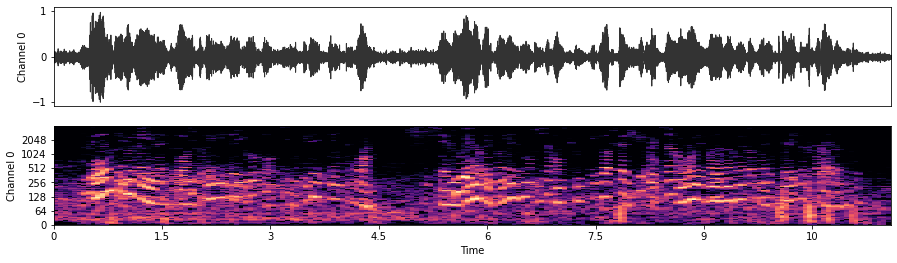

In [19]:
# Load example mixture
noisy_mixture = AudioContainer().load(
    filename=test_audio_noisy_filename, 
    fs=8000, 
    mono=True
)
noisy_mixture.plot(plot_type='dual', show_filename=False, figsize=(15,4))
Audio(noisy_mixture.data, rate=noisy_mixture.fs)

## Separate sound sources

In [20]:
noisy_estimated_sources = speech_separator.separate_batch(
    torch.from_numpy(noisy_mixture.data).float()[None,:]
)

### Source 1

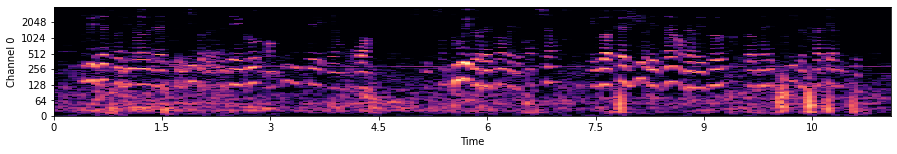

In [21]:
noisy_source1 = AudioContainer(data=tensor_to_numpy(noisy_estimated_sources[:, :, 0]), fs=8000)
noisy_source1.plot(plot_type='spec', show_filename=False, figsize=(15,2))

In [22]:
Audio(noisy_source1.data, rate=noisy_source1.fs)

### Source 2

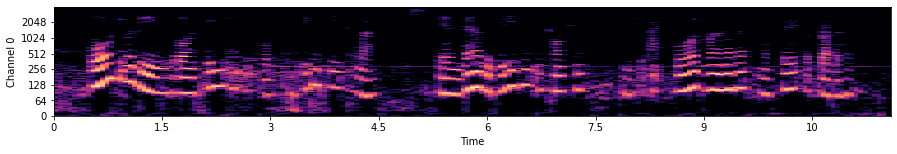

In [23]:
noisy_source2 = AudioContainer(data=tensor_to_numpy(noisy_estimated_sources[:, :, 1]), fs=8000)
noisy_source2.plot(plot_type='spec', show_filename=False, figsize=(15,2))

In [24]:
Audio(noisy_source2.data, rate=noisy_source2.fs)

## Enhanced source 1

In [25]:
estimated_source = speech_enhancer.separate_batch(
    torch.from_numpy(noisy_source1.data).float()[None,:]
)

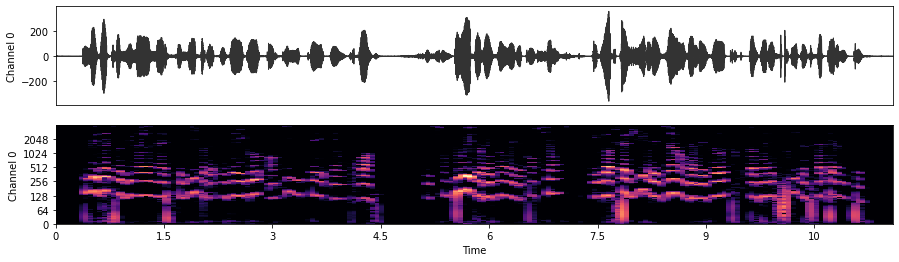

In [26]:
# Create audio container from wave data
source1_enhanced = dcase_util.containers.AudioContainer(
    data=tensor_to_numpy(estimated_source[:, :, 0]), 
    fs=8000
)

source1_enhanced.plot(plot_type='dual', show_filename=False, figsize=(15,4))
Audio(data=source1_enhanced.data, rate=source1_enhanced.fs)

## Enhanced source 2

In [27]:
estimated_source = speech_enhancer.separate_batch(
    torch.from_numpy(noisy_source2.data).float()[None,:]
)

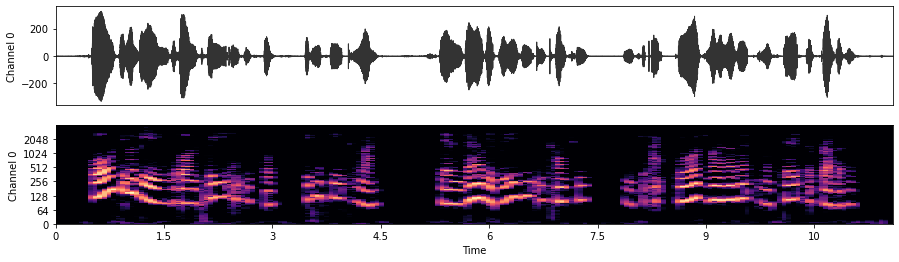

In [28]:
# Create audio container from wave data
source2_enhanced = dcase_util.containers.AudioContainer(
    data=tensor_to_numpy(estimated_source[:, :, 0]), 
    fs=8000
)

source2_enhanced.plot(plot_type='dual', show_filename=False, figsize=(15,4))
Audio(data=source2_enhanced.data, rate=source2_enhanced.fs)

# Language identification

*The task that automatically identifies the language of a given spoken utterance*

<img src="images/language_identification.png" width="400">

## ECAPA-TDNN Spoken Language Identification

- ECAPA-TDNN architecture    
    - Based on X-vector architecture using Time Delay Neural Network (TDNN) enhanced with statistics pooling layer, additional skip connections to propagate and aggregate channels, and channel attention
    - Used also for speech recognition and speaker verification
- Model trained with [VoxLingua107](http://bark.phon.ioc.ee/voxlingua107/)
    - Dataset consists of short speech segments automatically extracted from YouTube videos and labeled according to the language of the video title and description
    - Data for 107 languages, ~62 hours per language, 6628 hours in total
- Designed for single-channel audio with a 16kHz sampling rate

<small>Desplanques, B., Thienpondt, J., Demuynck, K., <strong>ECAPA-TDNN: Emphasized Channel Attention, Propagation and Aggregation in TDNN Based Speaker Verification</strong>. Proc. Interspeech 2020, pp. 3830-3834. <a href="https://arxiv.org/pdf/2005.07143.pdf" target="_blank">PDF</a></small>

## Usage  

We will use `EncoderClassifier` class from the SpeechBrain library with pretrained model (**speechbrain/lang-id-voxlingua107-ecapa**) from Hugging Face (https://huggingface.co/speechbrain/lang-id-voxlingua107-ecapa)

In [9]:
# Import
from speechbrain.pretrained import EncoderClassifier

# Create and download pretrained model
language_id = EncoderClassifier.from_hparams(
    source="speechbrain/lang-id-voxlingua107-ecapa", 
    savedir='pretrained_models/lang-id-voxlingua107-ecapa',
    run_opts={"device":"cuda"}
)

# Identify language
signal = language_id.load_audio("https://omniglot.com/soundfiles/udhr/udhr_fi.mp3")
lang = language_id.classify_batch(signal)[-1][0]

In [10]:
print('Identified language: {lang}'.format(lang=lang.split(':')[-1].strip()))

Identified language: Finnish


## Example 

Let's estimate languages for the sound sources separated earlier in the speech separation section.

To make sure audio has a 16kHz sampling rate.

In [11]:
# Resample if not 16kHz
if source1.fs != 16000:    
    source1 = source1.resample(target_fs=16000)

if source2.fs != 16000:    
    source2 = source2.resample(target_fs=16000)

## Language identification


In [12]:
# Identify languages for both sources
prediction1 = language_id.classify_batch(
    wavs=torch.from_numpy(source1.data).float()
)
prediction2 = language_id.classify_batch(
    wavs=torch.from_numpy(source2.data).float()
)

In [13]:
# Store language label for later use
lang1 = prediction1[-1][0].split(':')[0].strip()
lang2 = prediction2[-1][0].split(':')[0].strip()

print('Identified language for source 1:', prediction1[-1][0].split(':')[-1].strip())
print('Identified language for source 2:', prediction2[-1][0].split(':')[-1].strip())

Identified language for source 1: French
Identified language for source 2: English


# Speech recognition

*The task automatically recognizing the content of a given spoken utterance*

<img src="images/speech_recognition.png" width="400">

## Encoder-Decoder based Speech Recognition

- Encoder-Decoder architecture, a common architecture for sequence modeling
    - *Encoder* - sequence of speech is converted into a hidden representation
        - Pretrained [wav2vec 2.0](https://arxiv.org/pdf/1904.05862.pdf) embeddings combined with two DNN layers that are finetuned on the training dataset
    - *Decoder* - consumes the hidden representation and predicts the output
- Model trained with [CommonVoice](https://commonvoice.mozilla.org/en/datasets) dataset
    - Multi-language dataset created with volunteer contributors
    - For English there are 81085 speakers, in a total of 2953 hours of audio, annotations are 75% human validated
- Designed for single-channel audio with a 16kHz sampling rate

<small>S. Watanabe, T. Hori, S. Kim, J. R. Hershey, and T. Hayashi, <strong>Hybrid CTC/Attention Architecture for End-to-End Speech Recognition</strong>, in IEEE Journal of Selected Topics in Signal Processing, vol. 11, no. 8, pp. 1240-1253, Dec. 2017. <a href="https://www.merl.com/publications/docs/TR2017-190.pdf" target="_blank">PDF</a></small>

## Usage

We will use `EncoderASR` or `EncoderDecoderASR` classes from the SpeechBrain library with pretrained model (**speechbrain/asr-wav2vec2-commonvoice-LANG**) from Hugging Face (https://huggingface.co/speechbrain/asr-wav2vec2-commonvoice-en)

In [14]:
# Import
from speechbrain.pretrained import EncoderDecoderASR

# Create and download pretrained model
ASR = EncoderDecoderASR.from_hparams(
    source='speechbrain/asr-wav2vec2-commonvoice-en',     
    savedir='pretrained_models/asr-wav2vec2-commonvoice-en',
    run_opts={'device':'cuda'}       # for GPU   
)

# Apply speech recognition
text = ASR.transcribe_file('speechbrain/asr-wav2vec2-commonvoice-en/example.wav')

In [15]:
print('Recognized speech: {text}'.format(text=text))

Recognized speech: THE BIRCH CANOE SLID ON SMOOTH PLANKS


## Example

Let's estimate the content for both speech signals separated earlier in the speech separation section.

In [16]:
from speechbrain.pretrained import EncoderASR, EncoderDecoderASR

# Create models with languages (English and French)
asr_models = {
    'fr': EncoderASR.from_hparams(
        source='speechbrain/asr-wav2vec2-commonvoice-fr', 
        savedir='pretrained_models/asr-wav2vec2-commonvoice-fr',
        run_opts={"device":"cuda"}     # for GPU
    ),
    'en': EncoderDecoderASR.from_hparams(
        source='speechbrain/asr-wav2vec2-commonvoice-en', 
        savedir='pretrained_models/asr-wav2vec2-commonvoice-en',
        run_opts={"device":"cuda"}     # for GPU
    ),
}

### Apply speech recognition

In [20]:
pred_str1, pred_tokens1 = asr_models[lang1].transcribe_batch(
    wavs=torch.from_numpy(source1.resample(16000).data).float().unsqueeze(0), 
    wav_lens=torch.tensor([1.0])
)
text1 = pred_str1[0]

In [19]:
print('Recognized content for source 1 [{lang}]: \n{text}'.format(lang=lang1, text=text1))

Recognized content for source 1 [fr]: 
TOUS LES ÊTRES HUMAINS NAISSENT LIBRES ET ÉGAUX EN DIGNITÉ ET EN DROIT ILS SONT DOUÉS DE RAISONS ET DE CONSCIENCE ET DOIVENT AGIR LES UNS ENVERS LES AUTRES DANS UN ESPRIT DE FRATERNITÉ


In [21]:
pred_str2, pred_tokens2 = asr_models[lang2].transcribe_batch(
    wavs=torch.from_numpy(source2.resample(16000).data).float().unsqueeze(0), 
    wav_lens=torch.tensor([1.0])
)
text2 = pred_str2[0]

In [22]:
print('Recognized content for source 2 [{lang}]: \n{text}'.format(lang=lang2, text=text2))

Recognized content for source 2 [en]: 
ALL HUMAN BEINGS ON FREE AND EQUAL IN DIGNITY AND RIGHT THEY ARE ENDOWED WITH REASON AND CONSCIENCE AND SHOULD ACT TOWARDS ONE ANOTHER IN A SPIRIT OF BROTHERHOOD


# Text to speech

*The task that automatically converts text into speech*

<img src="images/text_to_speech.png" width="400">

## Tacotron

An end-to-end speech synthesis system by Google
- One of the first successful deep learning-based text-to-mel spectrogram models
- Model:
    - Encoder-decoder architecture with attention
    - Input: character sequence 
    - Output: mel spectrogram (50ms frame length and 12.5ms frame hop)
- Model trained with [LJ Speech](https://keithito.com/LJ-Speech-Dataset/) dataset
    - Speech dataset consisting of 13100 short audio clips of a single speaker reading passages from 7 non-fiction books
    - In total 24 hours of audio

<small>Wang, Yuxuan, R. J. Skerry-Ryan, Daisy Stanton, Yonghui Wu, Ron J. Weiss, Navdeep Jaitly, Zongheng Yang, Ying Xiao, Z. Chen, Samy Bengio, Quoc V. Le, Yannis Agiomyrgiannakis, Robert A. J. Clark and Rif A. Saurous. <strong>Tacotron: Towards End-to-End Speech Synthesis</strong>, INTERSPEECH (2017) <a href="https://arxiv.org/pdf/1703.10135.pdf" target="_blank">PDF</a></small>

## Example

We will use `Text2Speech` class from the **espnet2** library with [pretrained model](https://huggingface.co/espnet/kan-bayashi_ljspeech_tts_train_vits_raw_phn_tacotron_g2p_en_no_space_train.total_count.ave) <br>to convert recognized content of speech from sound source 2 into audio.

In [25]:
from espnet_model_zoo.downloader import ModelDownloader
from espnet2.bin.tts_inference import Text2Speech
d = ModelDownloader('pretrained_models') # Data downloader

# Create and download pretrained model
text2speech = Text2Speech(
    **d.download_and_unpack(
        'kan-bayashi/ljspeech_tts_train_vits_raw_phn_tacotron_g2p_en_no_space_train.total_count.ave'
    ), device="cuda"
)
# Apply model to text
speech = text2speech(text2)["wav"]

In [24]:
print(text2)
Audio(speech.cpu().numpy(), rate=22050)

ALL HUMAN BEINGS ON FREE AND EQUAL IN DIGNITY AND RIGHT THEY ARE ENDOWED WITH REASON AND CONSCIENCE AND SHOULD ACT TOWARDS ONE ANOTHER IN A SPIRIT OF BROTHERHOOD


## Machine translation and text to speech

Let's translate the recognized content of the first sound source into English (French -> English). 

We will use `transformers` pipeline from HuggingFace with [pretrained](https://huggingface.co/Helsinki-NLP) machine translation model provided by the NLP Research group at the University of Helsinki.

In [29]:
# Import
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

# Initialize the tokenizer
tokenizer = AutoTokenizer.from_pretrained(
    pretrained_model_name_or_path='Helsinki-NLP/opus-mt-{source}-{target}'.format(source='fr', target='en'), 
    cache_dir='pretrained_models'
)

# Initialize the model
model = AutoModelForSeq2SeqLM.from_pretrained(
    pretrained_model_name_or_path='Helsinki-NLP/opus-mt-{source}-{target}'.format(source='fr', target='en'),
    cache_dir='pretrained_models'
)

In [27]:
# Tokenize text
tokenized_text = tokenizer.prepare_seq2seq_batch([text1], return_tensors='pt')

# Perform translation and decode the output
translation = model.generate(**tokenized_text)
translated_text1 = tokenizer.batch_decode(translation, skip_special_tokens=True)[0]

# Print translated text
print(translated_text1)

ALL HUMAN BEHAVIOURS ARE BENEFIT AND EQUAL IN DIGNITY AND LAW AND ARE CARRIED FOR REASONS AND CONSCIENCE AND SHOULD TAKE THE ONE TOWARDS THE OTHER IN A FRATERNITY SPIRIT


In [28]:
# Apply model to text
speech = text2speech(translated_text1)["wav"]
Audio(speech.cpu().numpy(), rate=22050)

# Voice activity detection

*The task of detecting active speech segments*

<img src="images/voice_activity_detection.png" width="400">

## CRNN Voice activity detection

- CRNN architecture
    - Two CNN blocks, two bidirectional LSTM blocks, and a fully-connected layer
- Model trained with [LibriParty](https://drive.google.com/file/d/1--cAS5ePojMwNY5fewioXAv9YlYAWzIJ/view?usp=sharing) dataset
    - Dataset consists of ~5min long recordings created by mixing speech samples from [LibriSpeech](http://www.openslr.org/12) dataset with background sounds (environmental sounds)
    - 250 recordings, 20 hours in total
- Designed for single-channel audio with a 16kHz sampling rate
- System outputs posteriors probabilities with a value close to one for speech frames and close to zero for non-speech segments. A threshold is applied on top of the posteriors to detect candidate speech boundaries. 

## Usage

We will use `VAD` class from the SpeechBrain library with pretrained model <br> (**speechbrain/vad-crdnn-libriparty**) from Hugging Face (https://huggingface.co/speechbrain/vad-crdnn-libriparty).

In [31]:
# Import
from speechbrain.pretrained import VAD

# Create and download pretrained model
VAD = VAD.from_hparams(
    source='speechbrain/vad-crdnn-libriparty',           # Model name
    savedir='pretrained_models/vad-crdnn-libriparty'
)

# Detect segments with speech, segment boudaries in seconds
speech_segments = VAD.get_speech_segments(    
    audio_file='speechbrain/vad-crdnn-libriparty/example_vad.wav'
)

In [48]:
print('{onset}\t {offset}'.format(onset='Start', offset='Stop'))
print('{onset}\t {offset}'.format(onset='-----', offset='----'))
for segment in speech_segments.numpy()[1:4,:]:
    print('{onset:.1f}s\t {offset:.1f}s'.format(onset=segment[0], offset=segment[1]))

Start	 Stop
-----	 ----
14.3s	 17.3s
18.1s	 21.6s
28.6s	 36.9s


## Example

Let's run voice activity detection on a long speech signal with environmental sounds in the background.

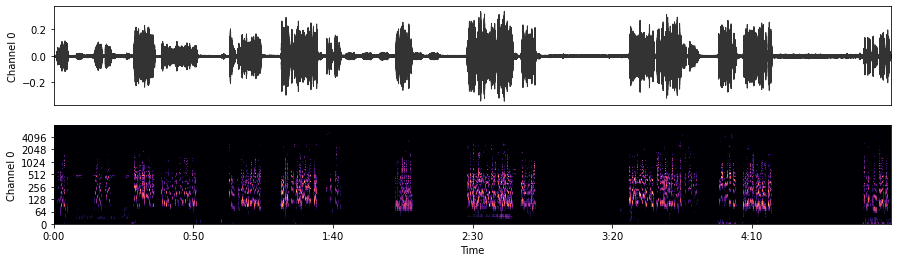

In [50]:
mixture = AudioContainer().load(
    filename=os.path.join('audio', 'example_vad.wav'), fs=16000, mono=True
)
mixture.plot(plot_type='dual', show_filename=False, figsize=(15,4))
Audio(data=mixture.data, rate=mixture.fs)

### Process the signal

In [51]:
# Computing speech vs non speech probabilities
prob_chunks = VAD.get_speech_prob_chunk(
    wavs=torch.from_numpy(mixture.data).float()    
)

# Apply a threshold to get candidate speech segments
prob_threshold = VAD.apply_threshold(prob_chunks).float()

# Comupute the boundaries of the speech segments
boundaries = VAD.get_boundaries(prob_threshold, output_value="seconds")

# Merge short segments
boundaries = VAD.merge_close_segments(boundaries, close_th=0.25)

# Remove short segments
boundaries = VAD.remove_short_segments(boundaries, len_th=0.25)

In [52]:
# Create event list
speech_activity = dcase_util.containers.MetaDataContainer()
for segment in boundaries.detach().cpu().numpy():
    speech_activity.append(
        dcase_util.containers.MetaDataItem(
            {
                'event_onset': segment[0],
                'event_offset': segment[1],
                'event_label': 'speech'
            }
        )
    )     

In [53]:
def plot_vad(signal, fs, segments=[]):
    pylab.figure(figsize=(15,12))
    
    time = np.arange(0., np.ceil(float(len(signal))) / fs, 1./fs )
    
    if len(time) > len(signal):
        time = time[: len(signal) - len(time)]

    pylab.subplot(211)
    for seg in segments:
        p = pylab.axvspan(seg['event_onset'], seg['event_offset'], fc='k', ec='k', lw=1, alpha=0.2)
    
    pylab.plot(time, signal)
    pylab.xlabel("Time (sec)", fontsize=22)
    pylab.show()

### Visualize speech segments

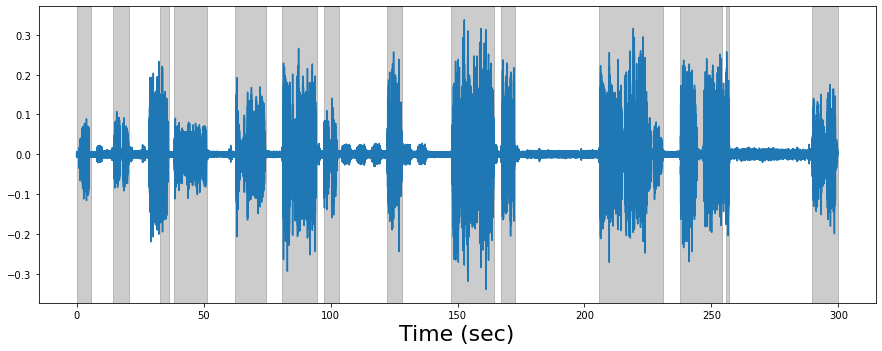

In [54]:
plot_vad(mixture.data, mixture.fs, speech_activity)   